# Generate interferograms and map lava flows using OPERA CSLC-S1

---    
This demonstration is based on example provided by the NASA Observational Products for End-Users from Remote Sensing Analysis (OPERA) project, written by M. Grace Bato at JPL.

The OPERA project is producing coregistered single-look-complex (CSLC) products from the Copernicus Sentinel-1 satellites that are highly similar to the NASA-ISRO SAR (NISAR) mission geocoded single-look-complex (GSLC) products. A similar type of calculation will be possible with the NISAR GSLC products.

Modified by Eric Fielding, JPL.

### Data Used in the Example:   

- **10 meter (Northing) x 5 meter (Easting) North America OPERA Coregistered Single Look Complex from Sentinel-1 products**
    - This dataset contains Level-2 OPERA coregistered single-look-complex (CSLC) data from Sentinel-1 (S1). <span style="color:red"> The data in this example are geocoded CSLC-S1 data covering Mauna Loa volcano in the Big Island, Hawaii</span>. 
    
    - The OPERA project is generating geocoded burst-wise CSLC-S1 products over North America which includes USA and US Territories within 200 km from the US border, Canada, and all mainland countries from the southern US border down to and including Panama. Each pixel within a burst SLC is represented by a complex number and contains both the amplitude and phase information. The CSLC-S1 products are distributed over projected map coordinates using the Universal Transverse Mercator (UTM) projection with spacing in the X- and Y-directions of 5 m and 10 m, respectively. Each OPERA CSLC-S1 product is distributed as a HDF5 file following the CF-1.8 convention with separate groups containing the data raster layers, the low-resolution correction layers, and relevant product metadata.

    - For more information about the OPERA project and other products please visit our website at https://www.jpl.nasa.gov/go/opera .

Please refer to the [OPERA Product Specification Document](https://d2pn8kiwq2w21t.cloudfront.net/documents/ProductSpec_CSLC_URS314199.pdf) for details about the CSLC-S1 product. 

Original notebook available from GitHub [OPERA Applications examples] (https://github.com/OPERA-Cal-Val/OPERA_Applications/tree/main)
*Prepared by M. Grace Bato*

---

## 0. Setup your conda environment

Assuming you have [miniconda](https://docs.conda.io/projects/miniconda/en/latest/miniconda-install.html) or conda installed.  Open your terminal and run the following:
```
> conda create -n opera_cslc python=3.11 --yes
> conda activate opera_cslc
> conda install -c conda-forge mamba --yes
> mamba env update -p ${CONDA_PREFIX} --file "opera_cslc_env.yml"
```
You can also use `miniforge` that includes mamba directly.

---    

## 1. Load Python modules
Load all the Python modules we need

In [1]:
## Load necessary modules
%load_ext watermark

import asf_search as asf
import geopandas as gpd
import pandas as pd

import numpy as np
from netrc import netrc
from subprocess import Popen
from platform import system
from getpass import getpass
import folium
import datetime as dt
from shapely.geometry import box
from shapely.geometry import Point
import shapely.wkt as wkt
import rioxarray
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cartopy.crs as ccrs
import xarray as xr
import rasterio
from rasterio.transform import from_origin
from rasterio import merge
from rasterio.crs import CRS

%watermark --iversions

import os

rioxarray : 0.17.0
platform  : 1.0.8
geopandas : 1.0.1
rasterio  : 1.4.1
shapely   : 2.0.6
asf_search: 8.0.1
cartopy   : 0.23.0
matplotlib: 3.9.2
xarray    : 2024.9.0
numpy     : 1.26.4
pandas    : 2.2.3
folium    : 0.17.0



In [2]:
## Load plotting module
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [3]:
## Load pandas and setup config to expand the display of the database
import pandas as pd
# pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
## Avoid lots of these warnings printing to notebook from asf_search
import warnings
warnings.filterwarnings('ignore')

## 2. Enter user-defined parameters

Here we enter the area of interest (aoi), track direction and track path number, reference date and secondary date of the pair to process, and the directory to save the working files in. We use some special functions that were imported above.

In [5]:
## Enter user-defined parameters
aoi = box(-155.6189, 19.3253, -155.4801, 19.6855)     # (W, S, E, N)
# aoi = "POLYGON((-155.6189 19.3253,-155.4801 19.3253,-155.4801 19.6855,-155.6189 19.6855,-155.6189 19.3253))"
orbitPass = "DESCENDING"
pathNumber = 87
referenceDate = dt.datetime.fromisoformat('2022-11-22 00:00:00')         #'YYYY-MM-DD HH:MM:SS'
secondaryDate = dt.datetime.fromisoformat('2022-12-04 23:59:59')         #'YYYY-MM-DD HH:MM:SS'
workDir = '/Users/fielding/Downloads/'
savedir = workDir+'MaunaLoa_D087_demo/'

## 3. Set up your NASA Earthdata Login Credentials

A NASA Earthdata account is required to download the OPERA or future NISAR data products. This code will ask you for your Earthdata login username and password if you don't have these saved in a `.netrc` or `_netrc` file in your home directory. The code will try to save your Earthdata username and password to the netrc file if you provide them interactively.

In [6]:
# Generates authentication token
# Asks for your Earthdata username and password for first time, if netrc does not exists.

urs = 'urs.earthdata.nasa.gov'    # Earthdata URL endpoint for authentication
prompts = ['Enter NASA Earthdata Login Username: ',
           'Enter NASA Earthdata Login Password: ']

# Determine the OS (Windows machines usually use an '_netrc' file)
netrc_name = "_netrc" if system()=="Windows" else ".netrc"

# Determine if netrc file exists, and if so, if it includes NASA Earthdata Login Credentials
try:
    netrcDir = os.path.expanduser(f"~/{netrc_name}")
    netrc(netrcDir).authenticators(urs)[0]

# Below, create a netrc file and prompt user for NASA Earthdata Login Username and Password
except FileNotFoundError:
    homeDir = os.path.expanduser("~")
    Popen('touch {0}{2} | echo machine {1} >> {0}{2}'.format(homeDir + os.sep, urs, netrc_name), shell=True)
    Popen('echo login {} >> {}{}'.format(getpass(prompt=prompts[0]), homeDir + os.sep, netrc_name), shell=True)
    Popen('echo \'password {} \'>> {}{}'.format(getpass(prompt=prompts[1]), homeDir + os.sep, netrc_name), shell=True)
    # Set restrictive permissions
    Popen('chmod 0600 {0}{1}'.format(homeDir + os.sep, netrc_name), shell=True)

    # Determine OS and edit netrc file if it exists but is not set up for NASA Earthdata Login
except TypeError:
    homeDir = os.path.expanduser("~")
    Popen('echo machine {1} >> {0}{2}'.format(homeDir + os.sep, urs, netrc_name), shell=True)
    Popen('echo login {} >> {}{}'.format(getpass(prompt=prompts[0]), homeDir + os.sep, netrc_name), shell=True)
    Popen('echo \'password {} \'>> {}{}'.format(getpass(prompt=prompts[1]), homeDir + os.sep, netrc_name), shell=True)


## 4. Query and download OPERA CSLCs using `asf_search`

These cells use the `asf_search` module to search for the OPERA CSLC-S1 products that are in the ASF DAAC covering the aoi and dates specified above. The cells get the metadata about the products including the area covered by each CSLC-S1 burst.

In [7]:
## Search for OPERA CSLC data in ASF DAAC
try:
    search_params = dict(
        intersectsWith= aoi,
        dataset='OPERA-S1',
        processingLevel='CSLC',
        flightDirection = orbitPass,
        start=referenceDate,
        end=secondaryDate)

    ## Return results
    results = asf.search(**search_params)
    print(f"Length of Results: {len(results)}")

except TypeError:
    search_params = dict(
        intersectsWith= aoi.wkt,
        dataset='OPERA-S1',
        processingLevel='CSLC',
        flightDirection = orbitPass,
        start=referenceDate,
        end=secondaryDate)

    ## Return results
    results = asf.search(**search_params)
    print(f"Length of Results: {len(results)}")

Length of Results: 6


In [8]:
## Save the results in a geopandas dataframe
gf = gpd.GeoDataFrame.from_features(results.geojson(), crs='EPSG:4326')

## Filter data based on specified track number
gf = gf[gf.pathNumber==pathNumber]
gf = gf[gf.pgeVersion=="2.1.1"]
gf

,geometry,centerLat,centerLon,stopTime,fileID,flightDirection,pathNumber,processingLevel,url,startTime,sceneName,browse,platform,bytes,md5sum,granuleType,orbit,polarization,processingDate,sensor,groupID,pgeVersion,operaBurstID,validityStartDate,subswath,fileName,beamModeType,s3Urls,beamMode,additionalUrls
0,"POLYGON ((-155.34903 19.41464, -156.1782 19.56...",19.405067,-155.776191,2022-12-04T16:16:55Z,OPERA_L2_CSLC-S1_T087-185683-IW2_20221204T1616...,DESCENDING,87,CSLC,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,2022-12-04T16:16:52Z,OPERA_L2_CSLC-S1_T087-185683-IW2_20221204T1616...,[https://datapool.asf.alaska.edu/BROWSE/OPERA-...,Sentinel-1A,{'OPERA_L2_CSLC-S1_T087-185683-IW2_20221204T16...,None,None,46184,[VV],2024-05-04T12:06:56Z,C-SAR,S1A_IWDV_0527_0534_046184_087,2.1.1,T087_185683_IW2,None,IW2,OPERA_L2_CSLC-S1_T087-185683-IW2_20221204T1616...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_C...,IW,[https://datapool.asf.alaska.edu/CSLC/OPERA-S1...
1,"POLYGON ((-155.31899 19.58157, -156.14521 19.7...",19.572554,-155.747751,2022-12-04T16:16:52Z,OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T1616...,DESCENDING,87,CSLC,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,2022-12-04T16:16:49Z,OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T1616...,[https://datapool.asf.alaska.edu/BROWSE/OPERA-...,Sentinel-1A,{'OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T16...,None,None,46184,[VV],2024-05-04T12:04:52Z,C-SAR,S1A_IWDV_0527_0534_046184_087,2.1.1,T087_185682_IW2,None,IW2,OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T1616...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_C...,IW,[https://datapool.asf.alaska.edu/CSLC/OPERA-S1...
2,"POLYGON ((-155.28443 19.74819, -156.11213 19.8...",19.739190,-155.715067,2022-12-04T16:16:50Z,OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T1616...,DESCENDING,87,CSLC,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,2022-12-04T16:16:46Z,OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T1616...,[https://datapool.asf.alaska.edu/BROWSE/OPERA-...,Sentinel-1A,{'OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T16...,None,None,46184,[VV],2024-05-04T12:02:48Z,C-SAR,S1A_IWDV_0527_0534_046184_087,2.1.1,T087_185681_IW2,None,IW2,OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T1616...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_C...,IW,[https://datapool.asf.alaska.edu/CSLC/OPERA-S1...
3,"POLYGON ((-155.35322 19.41478, -156.17956 19.5...",19.404955,-155.778227,2022-11-22T16:16:56Z,OPERA_L2_CSLC-S1_T087-185683-IW2_20221122T1616...,DESCENDING,87,CSLC,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,2022-11-22T16:16:53Z,OPERA_L2_CSLC-S1_T087-185683-IW2_20221122T1616...,[https://datapool.asf.alaska.edu/BROWSE/OPERA-...,Sentinel-1A,{'OPERA_L2_CSLC-S1_T087-185683-IW2_20221122T16...,None,None,46009,[VV],2024-05-04T08:46:50Z,C-SAR,S1A_IWDV_0527_0534_046009_087,2.1.1,T087_185683_IW2,None,IW2,OPERA_L2_CSLC-S1_T087-185683-IW2_20221122T1616...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_C...,IW,[https://datapool.asf.alaska.edu/CSLC/OPERA-S1...
4,"POLYGON ((-155.32022 19.58181, -156.14645 19.7...",19.572659,-155.749747,2022-11-22T16:16:53Z,OPERA_L2_CSLC-S1_T087-185682-IW2_20221122T1616...,DESCENDING,87,CSLC,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,2022-11-22T16:16:50Z,OPERA_L2_CSLC-S1_T087-185682-IW2_20221122T1616...,[https://datapool.asf.alaska.edu/BROWSE/OPERA-...,Sentinel-1A,{'OPERA_L2_CSLC-S1_T087-185682-IW2_20221122T16...,None,None,46009,[VV],2024-05-04T08:44:58Z,C-SAR,S1A_IWDV_0527_0534_046009_087,2.1.1,T087_185682_IW2,None,IW2,OPERA_L2_CSLC-S1_T087-185682-IW2_20221122T1616...,IW,[s3://asf-cumulus-prod-opera-browse/OPERA_L2_C...,IW,[https://datapool.asf.alaska.edu/CSLC/OPERA-S1...
5,"POLYGON ((-155.28572 19.74818, -156.11342 19.8...",19.739303,-155.716334,2022-11-22T16:16:50Z,OPERA_L2_CSLC-S1_T087-185681-IW2_20221122T1616...,DESCENDING,87,CSLC,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,2022-11-22T16:16:47Z,OPERA_L2_CSLC-S1_T087-185681-IW2_20221122T1616...,[https://datapool.asf.alaska.edu/BROWSE/OPERA-...,Sentinel-1A,{'OPERA_L2_CSLC-S1_T087-

In [9]:
# Get only relevant metadata
cslc_df = gf[['operaBurstID', 'fileID', 'startTime', 'stopTime', 'url', 'geometry', 'pgeVersion']]
cslc_df['startTime'] = pd.to_datetime(cslc_df.startTime).dt.date
cslc_df['stopTime'] = pd.to_datetime(cslc_df.stopTime).dt.date
cslc_df = cslc_df.drop_duplicates(subset=['operaBurstID', 'startTime'], ignore_index=True)
cslc_df

,operaBurstID,fileID,startTime,stopTime,url,geometry,pgeVersion
0,T087_185683_IW2,OPERA_L2_CSLC-S1_T087-185683-IW2_20221204T1616...,2022-12-04,2022-12-04,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.34903 19.41464, -156.1782 19.56...",2.1.1
1,T087_185682_IW2,OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T1616...,2022-12-04,2022-12-04,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.31899 19.58157, -156.14521 19.7...",2.1.1
2,T087_185681_IW2,OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T1616...,2022-12-04,2022-12-04,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.28443 19.74819, -156.11213 19.8...",2.1.1
3,T087_185683_IW2,OPERA_L2_CSLC-S1_T087-185683-IW2_20221122T1616...,2022-11-22,2022-11-22,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.35322 19.41478, -156.17956 19.5...",2.1.1
4,T087_185682_IW2,OPERA_L2_CSLC-S1_T087-185682-IW2_20221122T1616...,2022-11-22,2022-11-22,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.32022 19.58181, -156.14645 19.7...",2.1.1
5,T087_185681_IW2,OPERA_L2_CSLC-S1_T087-185681-IW2_20221122T1616...,2022-11-22,2022-11-22,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.28572 19.74818, -156.11342 19.8...",2.1.1


In [10]:
cslc_df[['operaBurstID', 'geometry']].explore(zoom=9, tiles="CartoDB positron")

This is a good place to check the map in the cell above to make sure the bursts that were selected by the search cover the area that we want our interferogram to cover.

## 5. Download the CSLC-S1 locally
These cells create a directory under the local `savedir` defined above and download the CSLC products, which are about 235 MB each. Then the product list is sorted to enable further processing.

In [11]:
## Download the relevant OPERA CSLCs to a temporary "cslc" folder 
os.makedirs(f'{savedir}/cslc', exist_ok='True')
asf.download_urls(urls=cslc_df.url, path=f'{savedir}/cslc', processes=10)

/Users/fielding/anaconda3/envs/opera_cslc/lib/python3.12/site-packages/asf_search/download/download.py:66: UserWarning: File already exists, skipping download: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T161646Z_20240504T113337Z_S1A_VV_v1.1.h5
  warnings.warn(f'File already exists, skipping download: {os.path.join(path, filename)}')
/Users/fielding/anaconda3/envs/opera_cslc/lib/python3.12/site-packages/asf_search/download/download.py:66: UserWarning: File already exists, skipping download: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T161649Z_20240504T113337Z_S1A_VV_v1.1.h5
  warnings.warn(f'File already exists, skipping download: {os.path.join(path, filename)}')
/Users/fielding/anaconda3/envs/opera_cslc/lib/python3.12/site-packages/asf_search/download/download.py:66: UserWarning: File already exists, skipping download: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087

In [12]:
# Sort the CSLC-S1 by date and burstID name
cslc_df = cslc_df.sort_values(by=["startTime", "operaBurstID"], ignore_index=True)
cslc_df

,operaBurstID,fileID,startTime,stopTime,url,geometry,pgeVersion
0,T087_185681_IW2,OPERA_L2_CSLC-S1_T087-185681-IW2_20221122T1616...,2022-11-22,2022-11-22,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.28572 19.74818, -156.11342 19.8...",2.1.1
1,T087_185682_IW2,OPERA_L2_CSLC-S1_T087-185682-IW2_20221122T1616...,2022-11-22,2022-11-22,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.32022 19.58181, -156.14645 19.7...",2.1.1
2,T087_185683_IW2,OPERA_L2_CSLC-S1_T087-185683-IW2_20221122T1616...,2022-11-22,2022-11-22,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.35322 19.41478, -156.17956 19.5...",2.1.1
3,T087_185681_IW2,OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T1616...,2022-12-04,2022-12-04,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.28443 19.74819, -156.11213 19.8...",2.1.1
4,T087_185682_IW2,OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T1616...,2022-12-04,2022-12-04,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.31899 19.58157, -156.14521 19.7...",2.1.1
5,T087_185683_IW2,OPERA_L2_CSLC-S1_T087-185683-IW2_20221204T1616...,2022-12-04,2022-12-04,https://datapool.asf.alaska.edu/CSLC/OPERA-S1/...,"POLYGON ((-155.34903 19.41464, -156.1782 19.56...",2.1.1


## 6. Read each CSLC-S1 and stack them together
The next cell defines a function to read the CSLC data out of the HDF5 product files, and then the cell after that goes through the list of files that were downloaded and plots the radar amplitude image for each CSLC burst product.

In [13]:
import h5py
def read_cslc(h5file):
    grid_path = f'data'
    metadata_path = f'metadata'
    burstmetadata_path = f'metadata/processing_information/input_burst_metadata'
    id_path = f'identification'

    with h5py.File(h5file,'r') as h5:
        print(f'Opening: {h5file}')  
        cslc = h5[f'{grid_path}/VV'][:]
        xcoor = h5[f'{grid_path}/x_coordinates'][:]
        ycoor = h5[f'{grid_path}/y_coordinates'][:]
        dx = h5[f'{grid_path}/x_spacing'][()].astype(int)
        dy = h5[f'{grid_path}/y_spacing'][()].astype(int)
        epsg = h5[f'{grid_path}/projection'][()].astype(int)
        sensing_start = h5[f'{burstmetadata_path}/sensing_start'][()].astype(str)
        sensing_stop = h5[f'{burstmetadata_path}/sensing_stop'][()].astype(str)
        dims = h5[f'{burstmetadata_path}/shape'][:]
        bounding_polygon = h5[f'{id_path}/bounding_polygon'][()].astype(str) 
        orbit_direction = h5[f'{id_path}/orbit_pass_direction'][()].astype(str)
        center_lon, center_lat = h5[f'{burstmetadata_path}/center']
        wavelength = h5[f'{burstmetadata_path}/wavelength'][()].astype(str)
        
    return cslc,xcoor, ycoor, dx, dy, epsg, sensing_start, sensing_stop, dims, bounding_polygon, orbit_direction, center_lon, center_lat, wavelength


2022-11-22
Opening: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185681-IW2_20221122T161647Z_20240504T081640Z_S1A_VV_v1.1.h5
2022-11-22
Opening: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185682-IW2_20221122T161650Z_20240504T081640Z_S1A_VV_v1.1.h5
2022-11-22
Opening: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185683-IW2_20221122T161653Z_20240504T081640Z_S1A_VV_v1.1.h5
2022-12-04
Opening: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185681-IW2_20221204T161646Z_20240504T113337Z_S1A_VV_v1.1.h5
2022-12-04
Opening: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185682-IW2_20221204T161649Z_20240504T113337Z_S1A_VV_v1.1.h5
2022-12-04
Opening: /Users/fielding/Downloads/MaunaLoa_D087_demo//cslc/OPERA_L2_CSLC-S1_T087-185683-IW2_20221204T161652Z_20240504T113337Z_S1A_VV_v1.1.h5


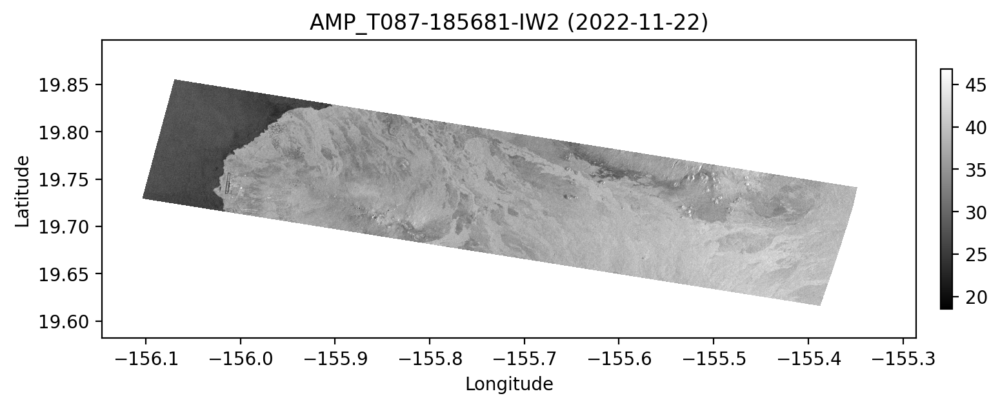

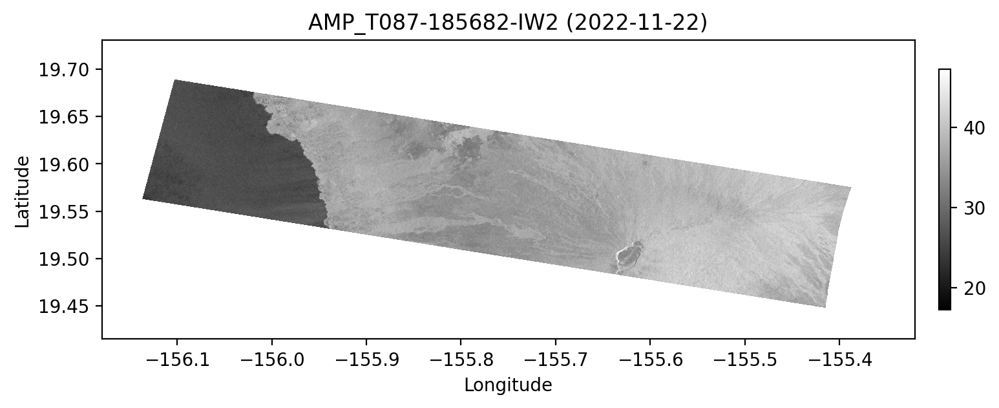

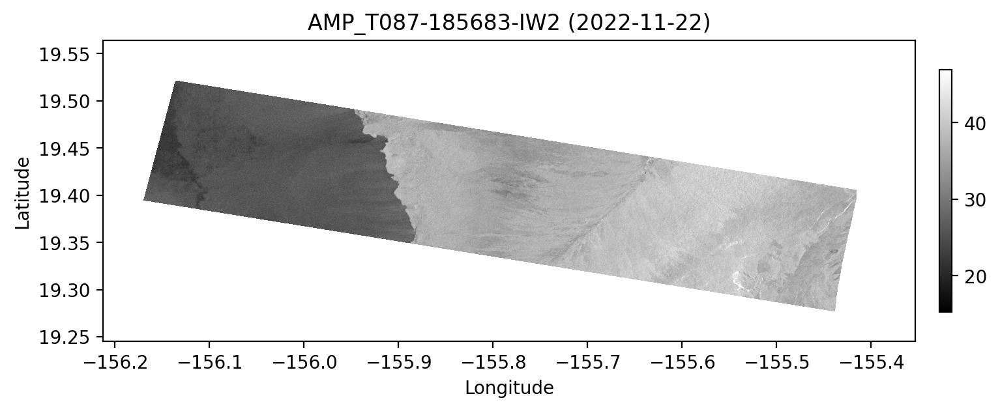

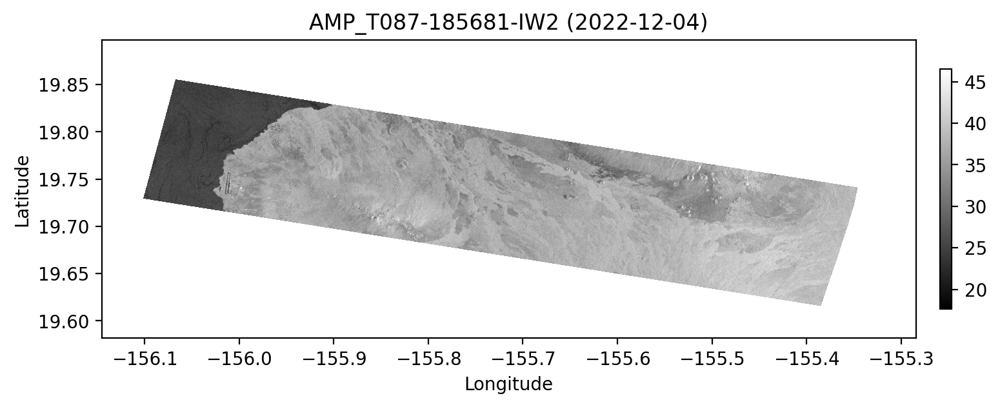

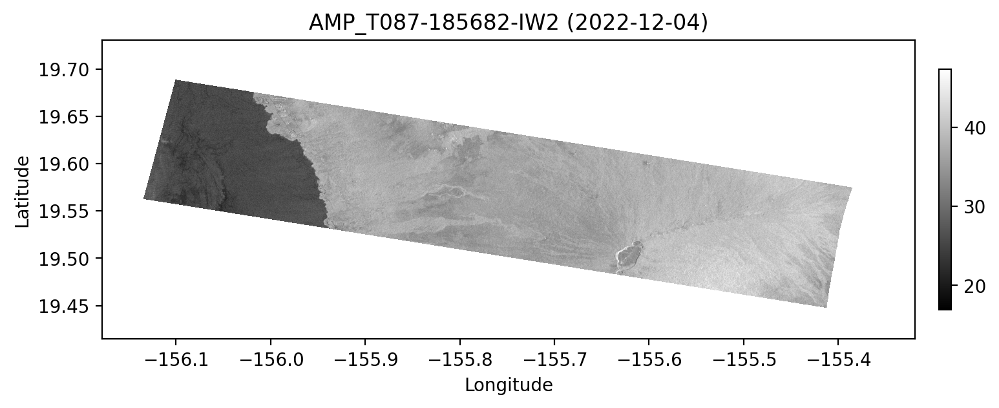

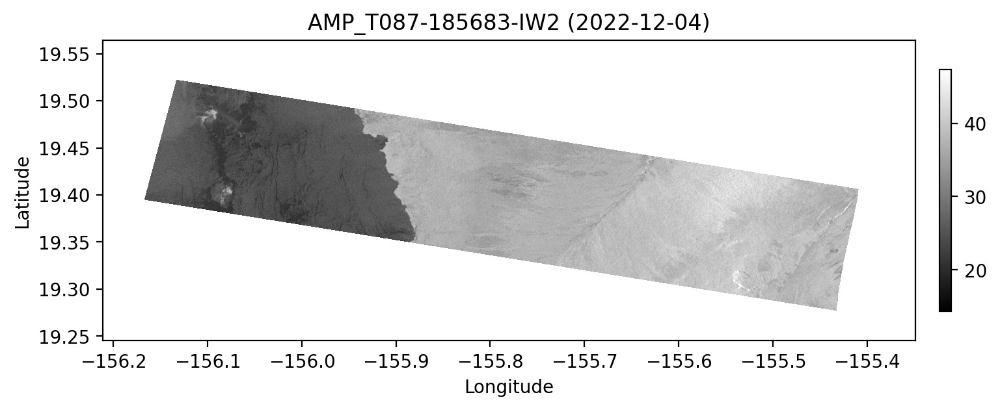

In [14]:
cslc_stack = []; cslc_dates = []; bbox_stack = []; xcoor_stack = []; ycoor_stack = [];
for fileID, start_date in zip(cslc_df.fileID, cslc_df.startTime):
    print(pd.to_datetime(start_date).date())
    cslc, xcoor, ycoor, dx, dy, epsg, sensing_start, sensing_stop, dims, bounding_polygon, orbit_direction, center_lon, center_lat, wavelength = read_cslc(f"{savedir}/cslc/{fileID}.h5")
    cslc_stack.append(cslc)
    cslc_dates.append(pd.to_datetime(sensing_start).date())
    
    # Plot
    cslc_poly = wkt.loads(bounding_polygon)
    bbox = [cslc_poly.bounds[0], cslc_poly.bounds[2], cslc_poly.bounds[1], cslc_poly.bounds[3]]
    scale_factor = 1.0; exp_factor= 0.2
    fig, ax = plt.subplots(figsize=(12, 3))
    cax=ax.imshow(20*np.log10(np.abs(cslc)), cmap='gray',interpolation=None, origin='upper', extent=bbox, vmin=np.nanpercentile(20*np.log10(np.abs(cslc)),2), vmax=np.nanpercentile(20*np.log10(np.abs(cslc)),98))
    cbar = fig.colorbar(cax,orientation='vertical',fraction=0.01,pad=0.02)
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f'AMP_{fileID.split("_")[3]} ({pd.to_datetime(start_date).date()})',fontsize=12)

    #Save metadata stack
    bbox_stack.append(bbox)
    xcoor_stack.append(xcoor)
    ycoor_stack.append(ycoor)

## 7. Generate the interferograms, compute the coherence, and save the files as GeoTiffs
The next several cells define some functions that will be used to calculate and perform smoothing on the interferograms, calculate the interferometric coherence, and save the interferogram phase and coherence to GeoTIFF files.

In [15]:
def colorize(array=[], cmap='RdBu', cmin=[], cmax=[]):
    normed_data = (array - cmin) / (cmax - cmin)    
    cm = plt.cm.get_cmap(cmap)
    return cm(normed_data) 

In [16]:
def moving_window_mean(image, size) -> np.ndarray:
    """Calculate the mean of a moving window of size `size`.

    Parameters
    ----------
    image : ndarray
        input image
    size : int or tuple of int
        Window size. If a single int, the window is square.
        If a tuple of (row_size, col_size), the window can be rectangular.

    Returns
    -------
    ndarray
        image the same size as `image`, where each pixel is the mean
        of the corresponding window.
    """
    if isinstance(size, int):
        size = (size, size)
    if len(size) != 2:
        raise ValueError("size must be a single int or a tuple of 2 ints")
    if size[0] % 2 == 0 or size[1] % 2 == 0:
        size = tuple(map(sum, zip(size, (1,1))))

    row_size, col_size = size
    row_pad = row_size // 2
    col_pad = col_size // 2

    # Pad the image with zeros
    image_padded = np.pad(
        image, ((row_pad + 1, row_pad), (col_pad + 1, col_pad)), mode="constant"
    )

    # Calculate the cumulative sum of the image
    integral_img = np.cumsum(np.cumsum(image_padded, axis=0), axis=1)
    if not np.iscomplexobj(integral_img):
        integral_img = integral_img.astype(float)

    # Calculate the mean of the moving window
    # Uses the algorithm from https://en.wikipedia.org/wiki/Summed-area_table
    window_mean = (
        integral_img[row_size:, col_size:]
        - integral_img[:-row_size, col_size:]
        - integral_img[row_size:, :-col_size]
        + integral_img[:-row_size, :-col_size]
    )
    window_mean /= row_size * col_size
    
    return window_mean

In [26]:
def calc_ifg_coh(reference, secondary):
    ifg_raw = reference * np.conjugate(secondary)
    amp = np.sqrt((reference * np.conjugate(reference)) * (secondary * np.conjugate(secondary)))
    ifg_cpx = np.exp(1j * np.nan_to_num(np.angle(ifg_raw)))
    ifg_smooth = moving_window_mean(ifg_cpx,(2,4))
    ifg = np.nan_to_num(np.angle(ifg_smooth))
    nan_mask = np.isnan(ifg_raw)
    ifg[nan_mask] = np.nan

    norm_ifg_cpx = np.exp(1j * np.nan_to_num(np.angle(ifg_raw/amp)))
    coh = np.clip(np.abs(moving_window_mean(norm_ifg_cpx, 5)), 0, 1)
    zero_mask = ifg_raw == 0
    coh[nan_mask] = np.nan
    coh[zero_mask] = 0

    return ifg, coh, amp

In [27]:
def rasterWrite(outtif,arr,transform,epsg,dtype='float32'):
    #writing geotiff using rasterio
    
    new_dataset = rasterio.open(outtif, 'w', driver='GTiff',
                            height = arr.shape[0], width = arr.shape[1],
                            count=1, dtype=dtype,
                            crs=CRS.from_epsg(epsg),
                            transform=transform,nodata=np.nan)
    new_dataset.write(arr, 1)
    new_dataset.close() 

The next cells make a list of burst IDs for the CSLC products and then go through the list forming pairs between the reference and secondary CSLC for each burst. The interferogram phase and coherence are displayed for each burst and they are saved to files in GeoTIFF format.

In [28]:
## Get the dates, burstIDs, and number of bursts 
cslc_dates = cslc_df[["startTime"]]
burstID = cslc_df.operaBurstID.drop_duplicates(ignore_index=True)
n_unique_burstID = len(burstID)

Reference: 2022-11-22  Secondary: 2022-12-04
Reference: 2022-11-22  Secondary: 2022-12-04
Reference: 2022-11-22  Secondary: 2022-12-04


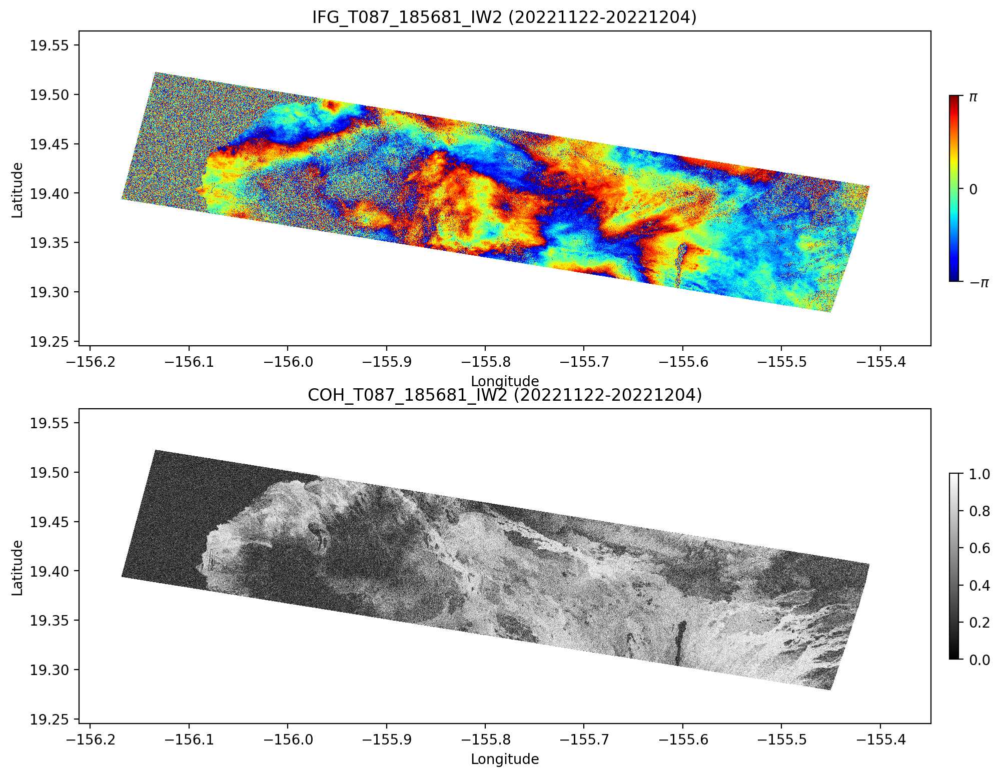

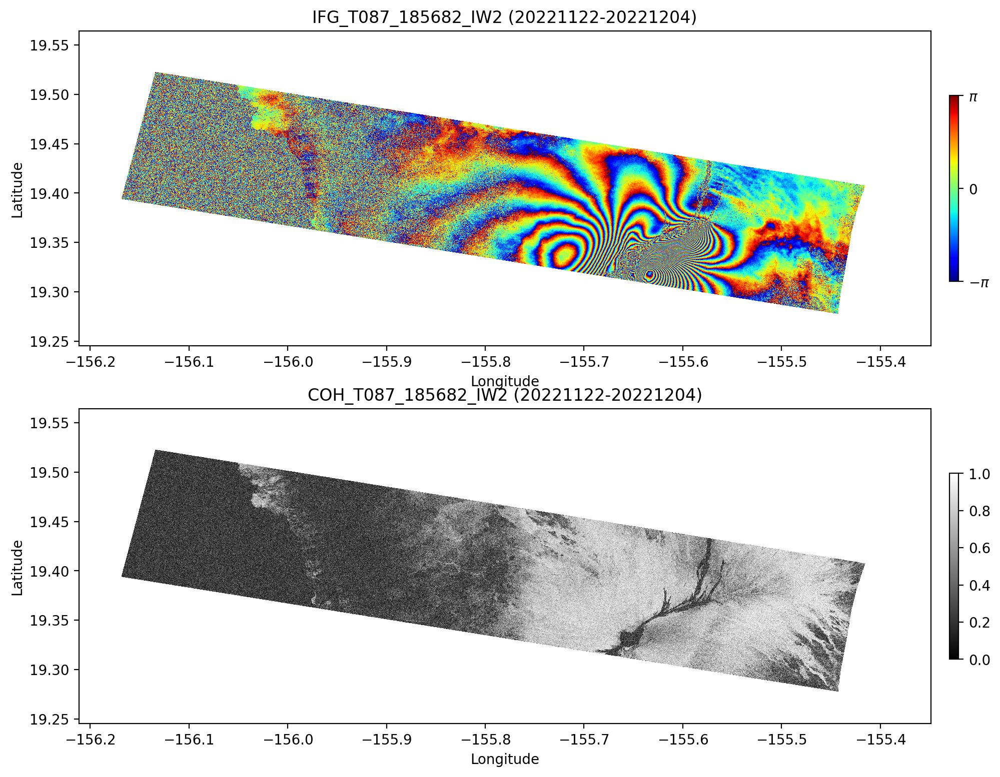

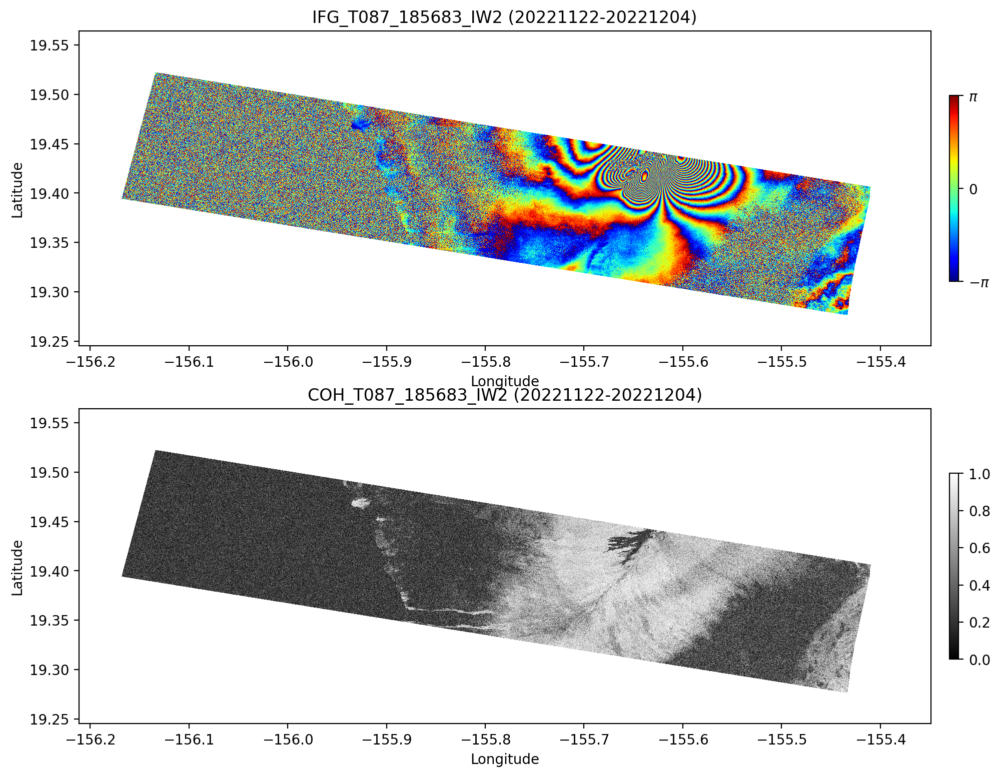

In [29]:
## For each date-pair, calculate the ifg, coh. Save the results as GeoTiffs.
for i in range(0,n_unique_burstID):
    ref_date = cslc_dates.iloc[i].values[0]
    sec_date = cslc_dates.iloc[i+n_unique_burstID].values[0]
    print(f"Reference: {ref_date}  Secondary: {sec_date}")

    # Calculate ifg, coh, amp
    ifg, coh, amp = calc_ifg_coh(cslc_stack[i], cslc_stack[i+n_unique_burstID])
    
    # Plot
    fig, ax = plt.subplots(2,1, figsize=(12,9))
    cax = ax[0].imshow(colorize(ifg, 'jet', -np.pi, np.pi), cmap='jet',interpolation='nearest', origin='upper',extent=bbox, vmin=-np.pi, vmax=np.pi)
    cbar = fig.colorbar(cax,orientation='vertical',fraction=0.01,pad=0.02)
    cbar.set_ticks([-np.pi, 0., np.pi])
    cbar.set_ticklabels([r'$-\pi$', '$0$', r'$\pi$'])
    ax[0].set_xlabel('Longitude')
    ax[0].set_ylabel('Latitude')
    ax[0].set_title(f'IFG_{burstID.iloc[i]} ({ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")})',fontsize=12)

    cax = ax[1].imshow(coh, cmap='gray',interpolation='nearest', origin='upper',extent=bbox, vmin=0., vmax=1.)
    ax[1].set_xlabel('Longitude')
    ax[1].set_ylabel('Latitude')
    fig.colorbar(cax,orientation='vertical',fraction=0.01,pad=0.02)
    ax[1].set_title(f'COH_{burstID.iloc[i]} ({ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")})',fontsize=12)

    # Save each interferogram as GeoTiff
    os.makedirs(f'{savedir}/tifs', exist_ok='True')
    transform = from_origin(xcoor_stack[i][0],ycoor_stack[i][0],dx,np.abs(dy))
    rasterWrite(f'{savedir}/tifs/ifg_{burstID.iloc[i]}_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}.tif',ifg,transform,epsg,dtype=rasterio.float32)
    rasterWrite(f'{savedir}/tifs/coh_{burstID.iloc[i]}_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}.tif',coh,transform,epsg,dtype=rasterio.float32)

## 8. Merge the burst-wise interferograms and coherence and save as GeoTiff.
Now we can merge the interferograms and coherence bursts and save them as merged GeoTIFF files.

In [30]:
def custom_merge(old_data, new_data, old_nodata, new_nodata, **kwargs):    
    mask = np.logical_and(~old_nodata, ~new_nodata)
    old_data[mask] = new_data[mask]
    mask = np.logical_and(old_nodata, ~new_nodata)
    old_data[mask] = new_data[mask]

In [31]:
# Merge burst-wise interferograms
ifg_files = [(f'{savedir}/tifs/ifg_{id}_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}.tif') for id in burstID]
ifg_files_to_mosaic = []

for f in ifg_files:
    src = rasterio.open(f)
    ifg_files_to_mosaic.append(src)

# Write merged interferogram to GeoTiff
dest, output_transform=merge.merge(ifg_files_to_mosaic, method=custom_merge)
outNameIfg = f"T{pathNumber}_merged_ifg_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}.tif"
with rasterio.open(ifg_files[0]) as src:
        out_meta = src.meta.copy() 
out_meta.update({"driver": "GTiff",
                 "height": dest.shape[1],
                 "width": dest.shape[2],
                 "transform": output_transform})
with rasterio.open(f"{savedir}/tifs/{outNameIfg}", "w", **out_meta) as dest1:
        dest1.write(dest)
        dest1.close()


In [32]:
# Merge burst-wise coherence
coh_files = [(f'{savedir}/tifs/coh_{id}_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}.tif') for id in burstID]
coh_files_to_mosaic = []

for f in coh_files:
    src = rasterio.open(f)
    coh_files_to_mosaic.append(src)

# Write merged coherence to GeoTiff
dest, output_transform=merge.merge(coh_files_to_mosaic, method=custom_merge)
outNameCoh = f"T{pathNumber}_merged_coh_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}.tif"
with rasterio.open(coh_files[0]) as src:
        out_meta = src.meta.copy() 
out_meta.update({"driver": "GTiff",
                 "height": dest.shape[1],
                 "width": dest.shape[2],
                 "transform": output_transform})
with rasterio.open(f"{savedir}/tifs/{outNameCoh}", "w", **out_meta) as dest1:
        dest1.write(dest)
        dest1.close()

## 9. Read the merged GeoTiff and Visualize using `matplotlib`
The next two cells read the merged GeoTIFF images, colorize the interferogram and apply a gray-scale to the coherence, and display them as maps. The GeoTIFF images can also be loaded into ArcGIS, QGIS, or other programs that support GeoTIFF images to apply different color scales or combine with other maps.

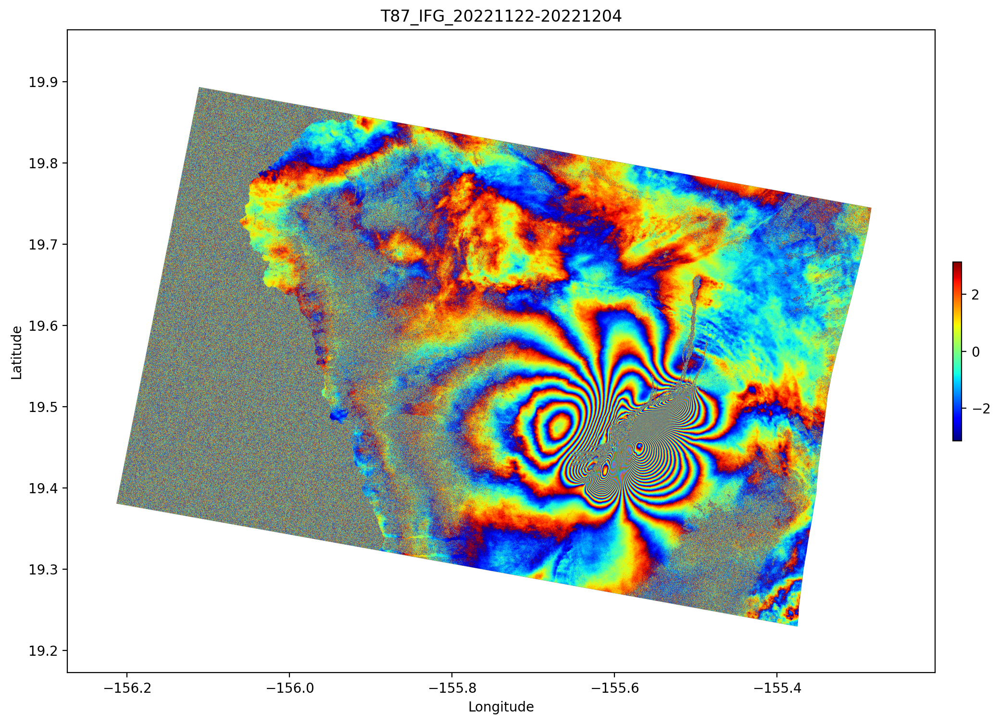

In [33]:
# Read the merged interferogram file
src = rioxarray.open_rasterio(f"{savedir}/tifs/{outNameIfg}")
merged_ifg = src.rio.reproject("EPSG:4326")[0]             # Folium maps are in EPSG:4326
minlon,minlat,maxlon,maxlat = merged_ifg.rio.bounds()

# this is a "wrapped" interferogram, so the values go from -pi to +pi
colored_merged_ifg = colorize(merged_ifg, 'jet', -np.pi, np.pi)

# Define new bounding box
new_bbox = [minlon,maxlon,minlat,maxlat]

# Plot using Matplotlib
fig, ax = plt.subplots(figsize=[12,9])
cax = ax.imshow(colored_merged_ifg, cmap='jet',interpolation=None, origin='upper',extent=new_bbox, vmin=-np.pi, vmax=np.pi)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title(f'T{pathNumber}_IFG_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}',fontsize=12)
fig.colorbar(cax,orientation='vertical',fraction=0.01,pad=0.02)
plt.show()

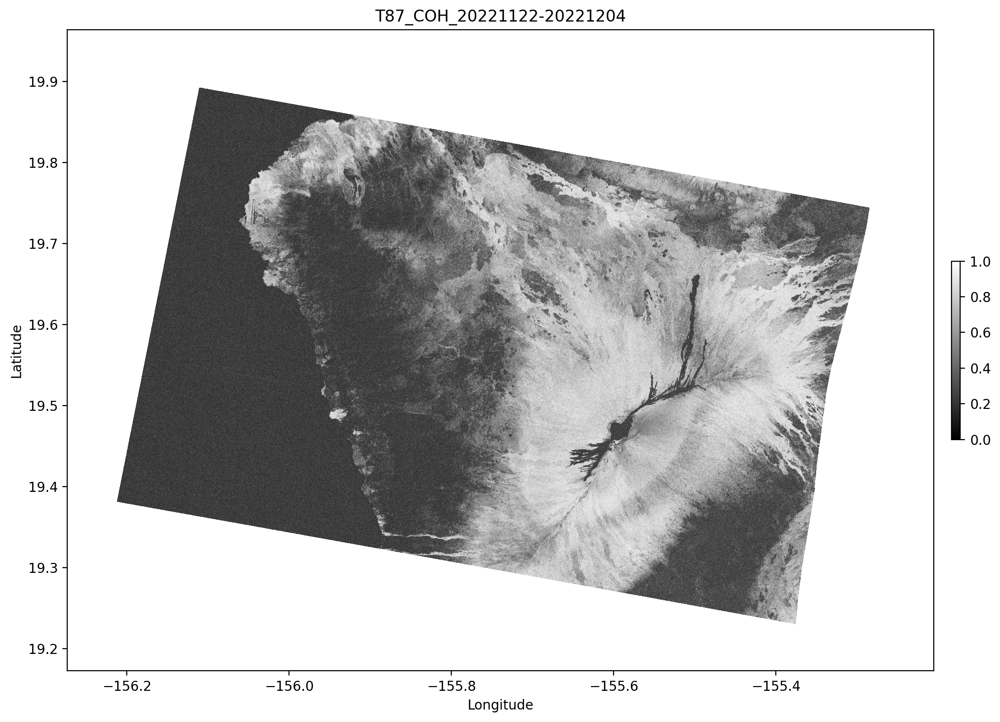

In [34]:
# Read the merged coherence file
src = rioxarray.open_rasterio(f"{savedir}/tifs/{outNameCoh}")
merged_coh = src.rio.reproject("EPSG:4326")[0]             # Folium maps are in EPSG:4326
minlon,minlat,maxlon,maxlat = merged_coh.rio.bounds()

# Define new bounding box
new_bbox = [minlon,maxlon,minlat,maxlat]

# Plot using Matplotlib
fig, ax = plt.subplots(figsize=[12,9])
# Coherence values vary from 0.0 to 1.0 so we use a grayscale colormap with that range
cax = ax.imshow(merged_coh, cmap='gray',interpolation=None, origin='upper',extent=new_bbox, vmin=0, vmax=1.0)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title(f'T{pathNumber}_COH_{ref_date.strftime("%Y%m%d")}-{sec_date.strftime("%Y%m%d")}',fontsize=12)
fig.colorbar(cax,orientation='vertical',fraction=0.01,pad=0.02)
plt.show()